# Visualize MKR features

The idea is to check if the implemenation makes sense as well as what to expect from the different features specifically if there is a zero offset in the feature

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

In [2]:
import inspect

import features as mkr
import tsfel as tsfel

In [3]:
useMKR = False

In [4]:
mapping = pd.read_csv('mapping.csv')

In [5]:
figsize=(20, 5)
figsizeHalf=(20, 3)

In [6]:
def matchLastDimByRepeat(values, wts):
    return np.repeat(np.expand_dims(values, axis=-1), np.ma.size(wts, axis=-1), axis=-1)

In [7]:
windows = 20
channels = 1 # this should always stay 1 (as the plots are not meant to be multidimensional)
samples = 64
totalSize = windows * channels * samples

# wts_flat = np.random.rand(totalSize) + np.sin(np.linspace(-np.pi, np.pi, totalSize)) / 2 + np.cos(np.tile(np.linspace(-np.pi, np.pi, samples // 3), windows * 4))[:totalSize] / 8. - np.linspace(0, 1.5, totalSize)
wts_flat = np.sin(2*np.pi*(2**np.linspace(2,10,totalSize))*np.arange(totalSize)/48000) + np.random.normal(0, 1, totalSize) * 0.15
# wts_flat = np.random.rand(totalSize) + np.sin(np.linspace(-np.pi, np.pi, totalSize)) / 2 - np.linspace(0, 1.5, totalSize)
wts_flat_pos = wts_flat + 2


wts_rand = wts_flat.reshape((windows, channels, samples)) 
wts_rand_pos = wts_flat_pos.reshape((windows, channels, samples))
print('Nr Windows: %s, Nr Channels: %s, Nr Values: %s' % (windows, channels, samples))

Nr Windows: 20, Nr Channels: 1, Nr Values: 64


In [8]:
ref_x = np.array(list(range(wts_flat.size)))
feature_x = np.linspace(0, wts_flat.size - samples, windows) + samples/2.

In [9]:
# sns.lineplot(x=ref_x, y=np.cos(np.tile(np.linspace(-np.pi, np.pi, samples), windows))[:len(ref_x)])

In [11]:
signal = pd.DataFrame(np.array([wts_flat, wts_flat_pos]).T, columns=['Ref-Rand', 'Ref-Pos'])

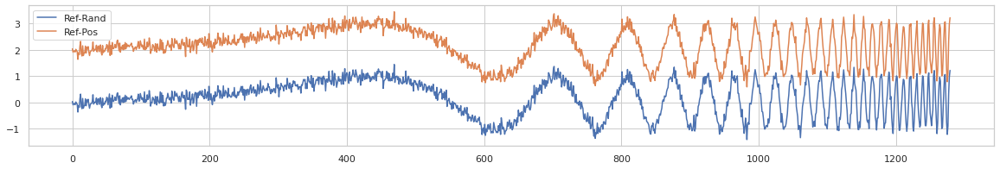

In [12]:
signal.plot(figsize=figsizeHalf)

In [28]:
fs = 10
signal_length = 50
a = np.linspace(0, fs // 2, signal_length // 2)
b = np.fft.rfftfreq(signal_length, d=1/50)
a, b, a.shape, b.shape

(array([0.        , 0.20833333, 0.41666667, 0.625     , 0.83333333,
        1.04166667, 1.25      , 1.45833333, 1.66666667, 1.875     ,
        2.08333333, 2.29166667, 2.5       , 2.70833333, 2.91666667,
        3.125     , 3.33333333, 3.54166667, 3.75      , 3.95833333,
        4.16666667, 4.375     , 4.58333333, 4.79166667, 5.        ]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.]),
 (25,),
 (26,))

In [14]:
# np.testing.assert_almost_equal(wts_rand[0][0], wts_rand_pos[0][0] - 2) 
# np.testing.assert_almost_equal(np.fft.fft(wts_rand[0][0])[1:len(wts_rand[0][0]) //2], np.fft.fft(wts_rand_pos[0][0])[1:len(wts_rand[0][0]) //2])
# np.testing.assert_almost_equal(np.fft.rfft(wts_rand[0][0])[1:], np.fft.rfft(wts_rand_pos[0][0])[1:])

### Notes on fft
Explanation difference in fft from  wts_rand to wts_rand_pos:
- the fft calculates a zero-frequency component which is influenced by the offset

Performance: 
- use np.fft.fftfreq over np.linspace (3.72 µs vs 19.8 µs)
- (use np.fft.rfft over np.fft.fft (10.3 µs vs 14.6 µs)
- window size might be faster if to a power of two, but doesn't seem to measurable 

In [15]:
default_tsfel = {
    'fs': 50,
}
default_mkr = {
    'samplingfrequency': 50
}

In [16]:
if useMKR:
    column = 'MKR'
    lib = mkr
    defaults = default_mkr
else:
    column = 'TSFEL'
    lib = tsfel
    defaults = default_tsfel

In [17]:
df = pd.DataFrame()
couldNotCalc = []
couldCalc = []

def _helper(key):
    fn = getattr(lib, key)
    fnArgs = {key: defaults[key] for key in list(inspect.signature(fn).parameters)[1:] if key in defaults}

    if useMKR:
        rand = fn(wts_rand, **fnArgs)
        pos = fn(wts_rand_pos, **fnArgs)
    else:
        rand = np.array([fn(x[0], **fnArgs) for x in wts_rand])
        pos = np.array([fn(x[0], **fnArgs) for x in wts_rand_pos])
    return rand, pos

# TODO: change this to fillna with the tsfel part and wrap that up
for key in sorted(mapping[column].dropna().to_list()):
    try:
        rand, pos = _helper(key)
        if len(rand.shape) > 1:
            for i in range(rand.shape[1]):
                df[f'{key}_{i}_rand'] = rand[:,i]
                df[f'{key}_{i}_pos'] = pos[:,i]
                couldCalc.append(f'{key}_{i}')
        else:
            df[f'{key}_rand'] = rand
            df[f'{key}_pos'] = pos
            couldCalc.append(key)
    except Exception as err:
        print(err, key)
        couldNotCalc.append(key)
        raise err

print('Could not calc these features:', couldNotCalc)

Could not calc these features: []


In [18]:
df

,abs_energy_rand,abs_energy_pos,auc_rand,auc_pos,autocorr_rand,autocorr_pos,calc_centroid_rand,calc_centroid_pos,calc_max_rand,calc_max_pos,...,wavelet_var_5_rand,wavelet_var_5_pos,wavelet_var_6_rand,wavelet_var_6_pos,wavelet_var_7_rand,wavelet_var_7_pos,wavelet_var_8_rand,wavelet_var_8_pos,zero_cross_rand,zero_cross_pos
0,1.379187,258.120563,0.097897,2.522617,1.379187,258.120563,0.639317,0.647842,0.319938,2.319938,...,0.011202,0.889533,0.012049,1.045389,0.013157,1.146910,0.014812,1.196256,30,0
1,1.884276,288.043898,0.156604,2.670273,1.884276,288.043898,0.602813,0.624097,0.446228,2.446228,...,0.009304,0.866852,0.008601,1.051057,0.009393,1.210057,0.010411,1.316106,17,0
2,4.105767,308.121258,0.247518,2.753881,4.105767,308.121258,0.716069,0.643461,0.466554,2.466554,...,0.044445,1.063749,0.047991,1.246821,0.049373,1.386464,0.048712,1.469768,14,0
3,8.016093,345.223585,0.399811,2.919811,8.016093,345.223585,0.704074,0.644135,0.630101,2.630101,...,0.068439,1.280297,0.069798,1.461492,0.066938,1.585680,0.061230,1.648049,2,0
4,18.986890,409.317094,0.662844,3.182844,18.986890,409.317094,0.695815,0.644184,0.934657,2.934657,...,0.092096,1.483098,0.111212,1.773556,0.130323,2.015824,0.144656,2.173499,0,0
5,39.639872,492.109258,0.966364,3.486364,39.639872,492.109258,0.706796,0.651510,1.199352,3.199352,...,0.138511,1.610821,0.142078,1.860311,0.156168,2.087979,0.175651,2.253461,0,0
6,60.324040,561.484005,1.205981,3.725981,60.324040,561.484005,0.665096,0.642139,1.280281,3.280281,...,0.176361,1.766985,0.203166,2.100468,0.229535,2.367650,0.249146,2.535997,0,0
7,47.833887,519.637621,1.062731,3.582731,47.833887,519.637621,0.535259,0.600863,1.438952,3.438952,...,0.122234,1.571127,0.141638,1.863020,0.171779,2.128624,0.205997,2.324414,0,0
8,9.030116,300.042574,0.399167,2.692214,9.030116,300.042574,0.429263,0.522740,0.698579,2.698579,...,0.191984,1.096515,0.267840,1.315001,0.367378,1.492365,0.495902,1.644107,5,0
9,52.601095,83.129500,1.110883,1.409117,52.601095,83.129500,0.714040,0.552085,-0.439851,1.560149,...,0.113864,0.558225,0.111266,0.753023,0.119401,0.927685,0.143309,1.056222,0,0


In [19]:
diff = df.melt().groupby(['variable'])[['value']].nunique()
diff[diff['value'] <= 1].unstack()

       variable                    
value  ecdf_0_pos                      1
       ecdf_0_rand                     1
       ecdf_1_pos                      1
       ecdf_1_rand                     1
       ecdf_2_pos                      1
       ecdf_2_rand                     1
       ecdf_3_pos                      1
       ecdf_3_rand                     1
       ecdf_4_pos                      1
       ecdf_4_rand                     1
       ecdf_5_pos                      1
       ecdf_5_rand                     1
       ecdf_6_pos                      1
       ecdf_6_rand                     1
       ecdf_7_pos                      1
       ecdf_7_rand                     1
       ecdf_8_pos                      1
       ecdf_8_rand                     1
       ecdf_9_pos                      1
       ecdf_9_rand                     1
       ecdf_percentile_count_0_pos     1
       ecdf_percentile_count_0_rand    1
       ecdf_percentile_count_1_pos     1
       ecdf_percentil

/share/temp/yhartmann/mkr/venv_home/lib/python3.8/site-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/share/temp/yhartmann/mkr/venv_home/lib/python3.8/site-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


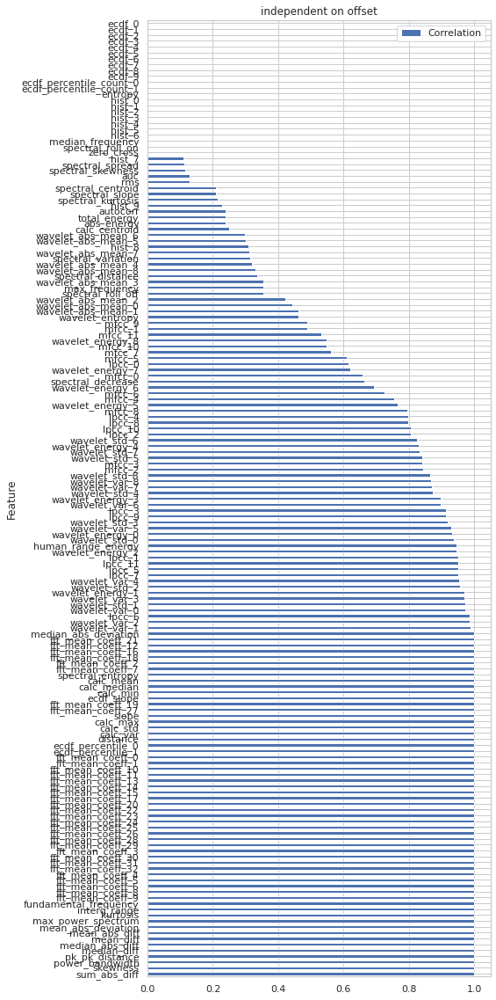

In [20]:
corsDf = pd.DataFrame([[key, np.corrcoef(df['%s_rand' % key], df['%s_pos' % key])[0,1]] for key in couldCalc], columns=['Feature', 'Correlation']).set_index('Feature').abs()
# corsDf['Correlation'] = corsDf['Correlation'].abs()
corsDf.sort_values(by=['Correlation', 'Feature'], ascending=False).plot(kind='barh', figsize=(7,20), title="independent on offset")

# corsDf[corsDf['Correlation'].abs() < 0.98].set_index('Feature').plot(kind='bar', figsize=(10,7), title="dependent on offset")
# corsDf[corsDf['Correlation'].abs() >= 0.98].set_index('Feature') #.plot(kind='bar', figsize=(10,7), title="indifferent to offset")

In [21]:
corsDf.loc['zero_cross']

Correlation   NaN
Name: zero_cross, dtype: float64

In [22]:
def plot_single(name, df):
    fig, ax1 = plt.subplots(1, 1, figsize=figsizeHalf)
    fig.suptitle(name)

    sns.lineplot(x=ref_x, y=signal['Ref-Rand'], color="g", ax=ax1, alpha=0.5)
    ax1b = ax1.twinx()
    sns.lineplot(x=feature_x, y=df['%s_rand' % name], color="b", ax=ax1b)

    plt.show()

def compare_visual(name, df):
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize)
    fig.suptitle(name)

    sns.lineplot(x=ref_x, y=signal['Ref-Rand'], color="g", ax=ax1, alpha=0.5)
    ax1b = ax1.twinx()
    sns.lineplot(x=feature_x, y=df['%s_rand' % name], color="b", ax=ax1b)

    sns.lineplot(x=ref_x, y=signal['Ref-Pos'], color="g", ax=ax2, alpha=0.5)
    ax2b = ax2.twinx()
    sns.lineplot(x=feature_x, y=df['%s_pos' % name], color="b", ax=ax2b)
    
    plt.show()

In [23]:
feature_x.size, df['%s_rand' % key].size

(20, 20)

In [24]:
[key for key in couldCalc if corsDf.loc[key][0] < 0.99]

['abs_energy',
 'auc',
 'autocorr',
 'calc_centroid',
 'hist_7',
 'hist_8',
 'hist_9',
 'human_range_energy',
 'lpcc_0',
 'lpcc_1',
 'lpcc_2',
 'lpcc_3',
 'lpcc_4',
 'lpcc_5',
 'lpcc_6',
 'lpcc_7',
 'lpcc_8',
 'lpcc_9',
 'lpcc_10',
 'lpcc_11',
 'max_frequency',
 'mfcc_0',
 'mfcc_1',
 'mfcc_2',
 'mfcc_3',
 'mfcc_4',
 'mfcc_5',
 'mfcc_6',
 'mfcc_7',
 'mfcc_8',
 'mfcc_9',
 'mfcc_10',
 'mfcc_11',
 'rms',
 'spectral_centroid',
 'spectral_decrease',
 'spectral_distance',
 'spectral_kurtosis',
 'spectral_roll_off',
 'spectral_skewness',
 'spectral_slope',
 'spectral_spread',
 'spectral_variation',
 'total_energy',
 'wavelet_abs_mean_0',
 'wavelet_abs_mean_1',
 'wavelet_abs_mean_2',
 'wavelet_abs_mean_3',
 'wavelet_abs_mean_4',
 'wavelet_abs_mean_5',
 'wavelet_abs_mean_6',
 'wavelet_abs_mean_7',
 'wavelet_abs_mean_8',
 'wavelet_energy_0',
 'wavelet_energy_1',
 'wavelet_energy_2',
 'wavelet_energy_3',
 'wavelet_energy_4',
 'wavelet_energy_5',
 'wavelet_energy_6',
 'wavelet_energy_7',
 'wavelet_

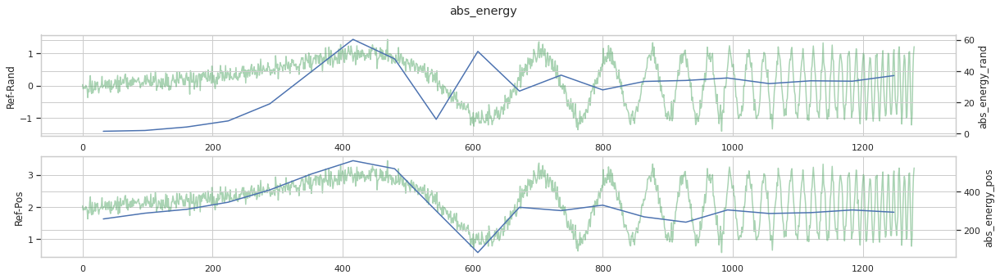

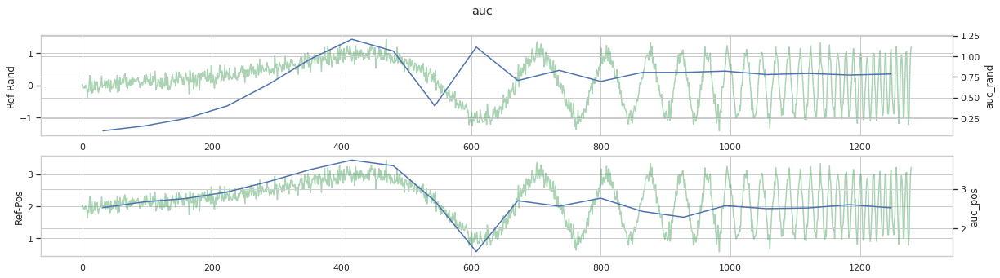

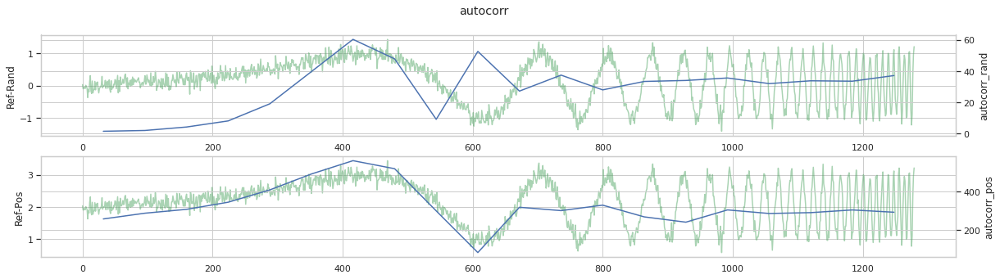

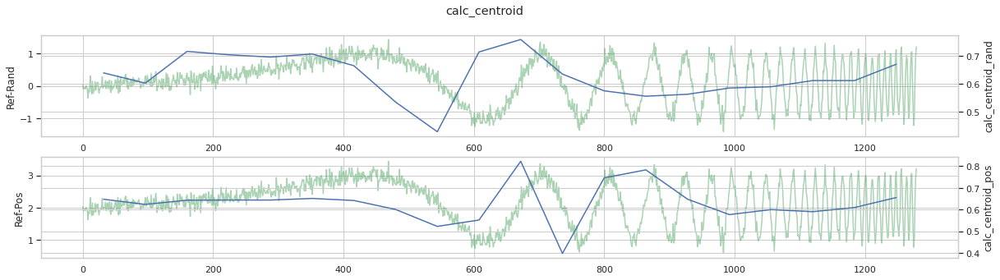

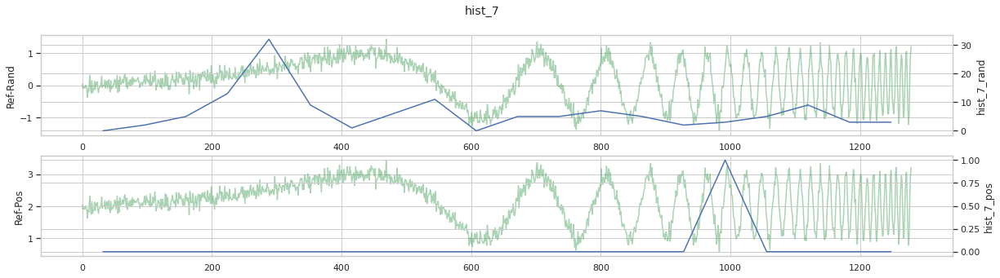

...

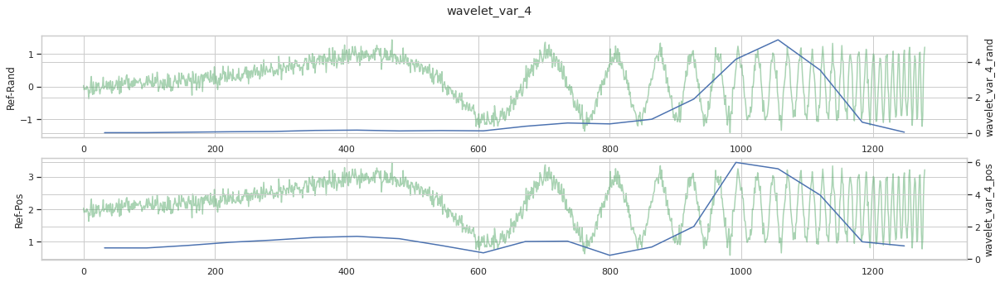

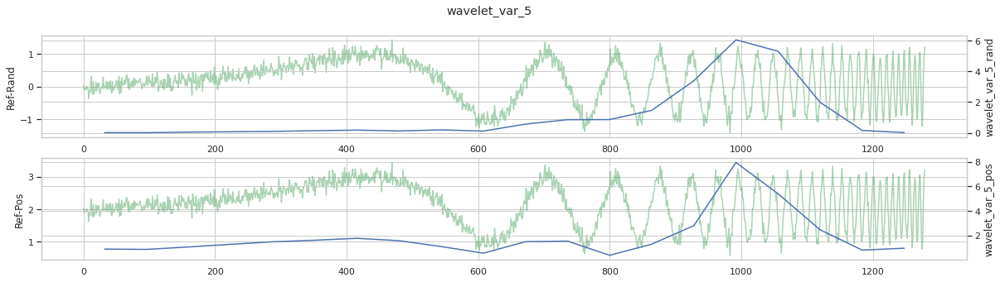

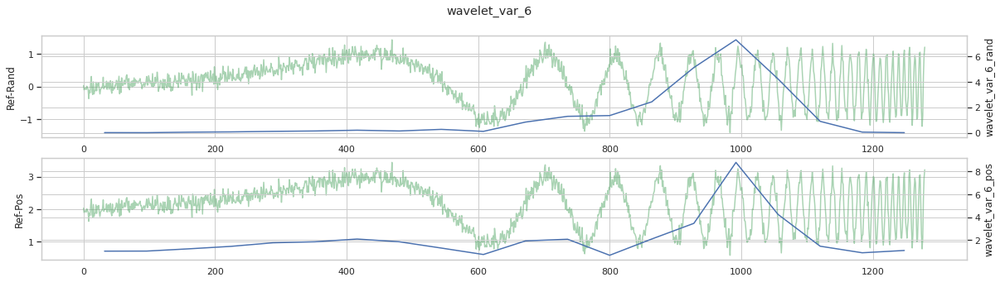

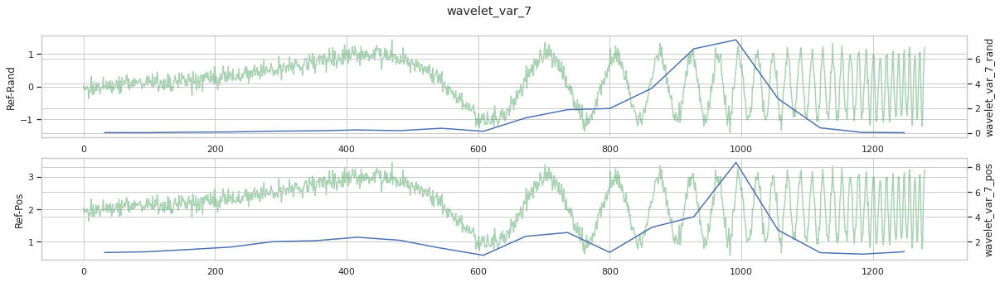

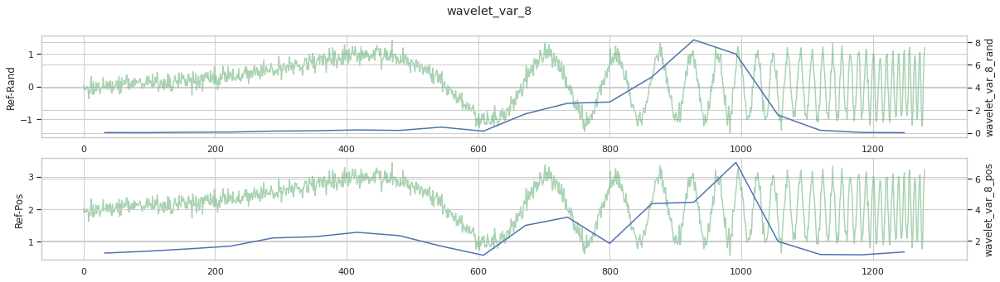

CPU times: user 47.9 s, sys: 183 ms, total: 48.1 s
Wall time: 48 s


In [25]:
%%time

for key in couldCalc:
# key = 'calc_mean'
    if corsDf.loc[key][0] < 0.99:
        compare_visual(key, df)

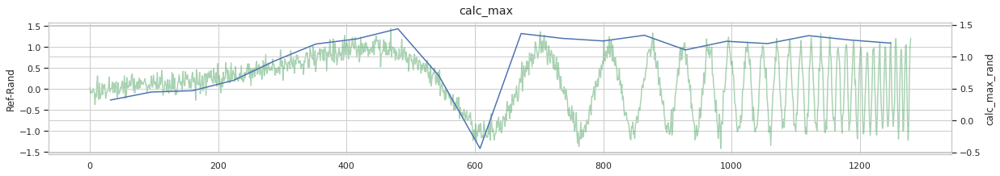

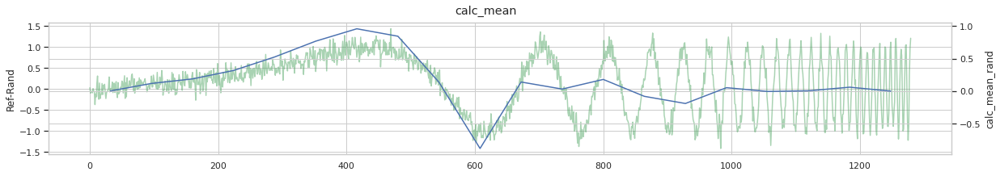

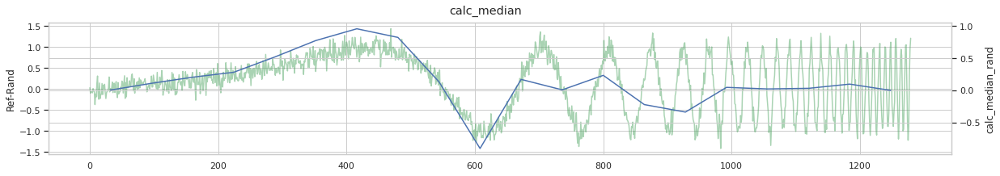

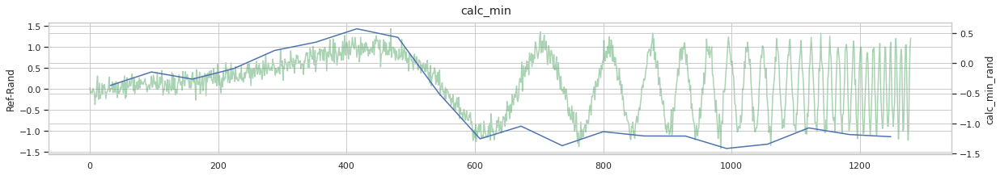

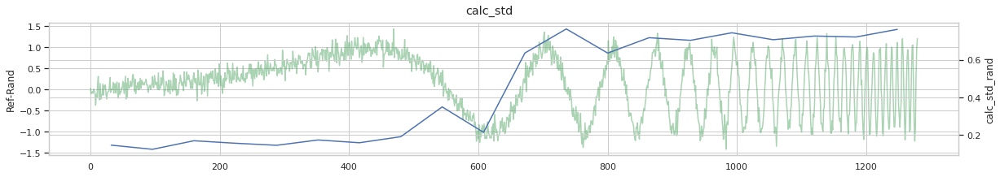

...

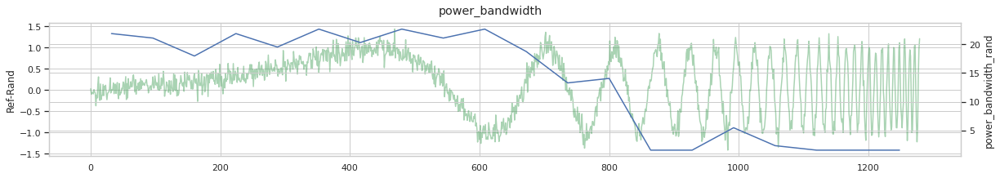

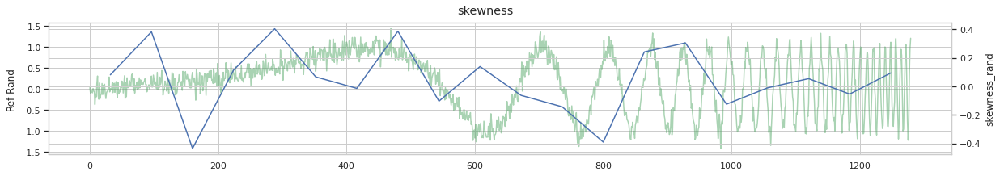

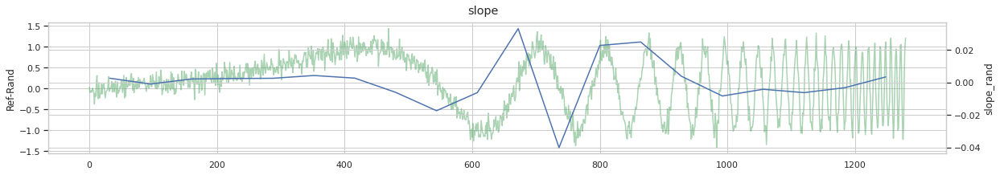

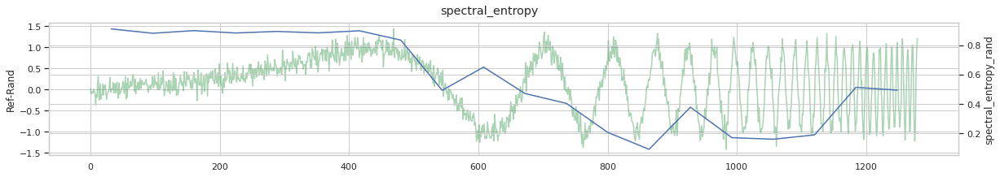

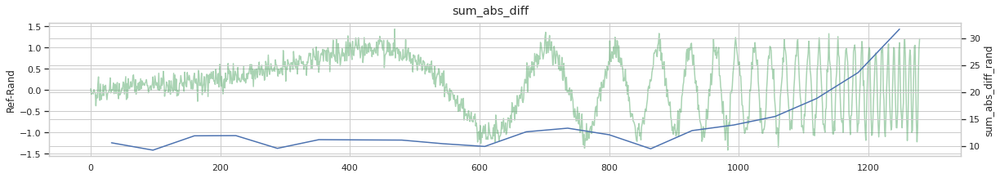

CPU times: user 18.7 s, sys: 84.7 ms, total: 18.7 s
Wall time: 18.7 s


In [26]:
%%time

for key in couldCalc:
# key = 'calc_mean'
    if corsDf.loc[key][0] >= 0.99:
        plot_single(key, df)